### Reading and Understanding the Data

In [1]:
# Supress Warnings
import sys
import warnings
if not sys.warnoptions:
    warnings.filterwarnings('ignore')
    
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier
# Specifing path for dot file.
import os
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV



# Importing Telecom dataset
churn_data = pd.read_csv("telecom_churn_data.csv")
churn_data.head()


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [2]:
churn_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [3]:
churn_data.columns.values

array(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7',
       'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6',
       'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6',
       'std_og_t2t

## Data Cleaning and  preparation

In [4]:
# Deriving a new feature churn
churn_data['churn']=churn_data['total_ic_mou_9']+churn_data['total_og_mou_9']+churn_data['vol_2g_mb_9']+churn_data['vol_3g_mb_9']
churn_data['churn']=churn_data['churn'].apply(lambda x: 1 if x==0 else 0)

In [5]:
# standerdization of the data fields  
churn_data['last_date_of_month_6'] = churn_data['last_date_of_month_6'].replace(np.nan, '6/30/2014')
churn_data['last_date_of_month_7'] = churn_data['last_date_of_month_7'].replace(np.nan, '7/31/2014')
churn_data['last_date_of_month_8'] = churn_data['last_date_of_month_8'].replace(np.nan, '8/31/2014')


churn_data['last_date_of_month_6'] = pd.to_datetime(churn_data['last_date_of_month_6'])
churn_data['last_date_of_month_7'] = pd.to_datetime(churn_data['last_date_of_month_7'])
churn_data['last_date_of_month_8'] = pd.to_datetime(churn_data['last_date_of_month_8'])


churn_data['date_of_last_rech_6'] = pd.to_datetime(churn_data['date_of_last_rech_6'])
churn_data['date_of_last_rech_7'] = pd.to_datetime(churn_data['date_of_last_rech_7'])
churn_data['date_of_last_rech_8'] = pd.to_datetime(churn_data['date_of_last_rech_8'])


churn_data['date_of_last_rech_data_6'] = pd.to_datetime(churn_data['date_of_last_rech_data_6'])
churn_data['date_of_last_rech_data_7'] = pd.to_datetime(churn_data['date_of_last_rech_data_7'])
churn_data['date_of_last_rech_data_8'] = pd.to_datetime(churn_data['date_of_last_rech_data_8'])



# Derive Columns for each month, which will tell before how many days from month end, 
#recharge happened by subscriber

churn_data['recharge_voice_days_6']=churn_data['last_date_of_month_6'] - churn_data['date_of_last_rech_6']
churn_data['recharge_voice_days_7']=churn_data['last_date_of_month_7'] - churn_data['date_of_last_rech_7']
churn_data['recharge_voice_days_8']=churn_data['last_date_of_month_8'] - churn_data['date_of_last_rech_8']


churn_data['recharge_Data_days_6']=churn_data['last_date_of_month_6'] - churn_data['date_of_last_rech_data_6']
churn_data['recharge_Data_days_7']=churn_data['last_date_of_month_7'] - churn_data['date_of_last_rech_data_7']
churn_data['recharge_Data_days_8']=churn_data['last_date_of_month_8'] - churn_data['date_of_last_rech_data_8']


churn_data['recharge_voice_days_6']=churn_data['recharge_voice_days_6'].apply(lambda x:str(x).split('days')[0])
churn_data['recharge_voice_days_7']=churn_data['recharge_voice_days_7'].apply(lambda x:str(x).split('days')[0])
churn_data['recharge_voice_days_8']=churn_data['recharge_voice_days_8'].apply(lambda x:str(x).split('days')[0])


churn_data['recharge_Data_days_6']=churn_data['recharge_Data_days_6'].apply(lambda x:str(x).split('days')[0])
churn_data['recharge_Data_days_7']=churn_data['recharge_Data_days_7'].apply(lambda x:str(x).split('days')[0])
churn_data['recharge_Data_days_8']=churn_data['recharge_Data_days_8'].apply(lambda x:str(x).split('days')[0])

churn_data['recharge_voice_days_6']=churn_data['recharge_voice_days_6'].fillna(30)
churn_data['recharge_voice_days_7']=churn_data['recharge_voice_days_7'].fillna(30)
churn_data['recharge_voice_days_8']=churn_data['recharge_voice_days_8'].fillna(30)

churn_data['recharge_Data_days_6']=churn_data['recharge_Data_days_6'].fillna(30)
churn_data['recharge_Data_days_7']=churn_data['recharge_Data_days_7'].fillna(30)
churn_data['recharge_Data_days_8']=churn_data['recharge_Data_days_8'].fillna(30)


In [6]:
#Detect the categorical variable in the dataframe

cat_cols=churn_data.select_dtypes(include=['category']).columns
cat_cols
                                              
Datatime_cols=churn_data.select_dtypes(include=['datetime64']).columns

Datatime_cols

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

#### Data quality checks  and inconsistent/missing data is handling

In [7]:
#Remove columns with standard deviation 0(As all values of a data set are the same and Every data value is equal to the mean)

churn_data.drop(churn_data.std()[churn_data.std() ==0 ].index.values, axis=1,inplace=True)

# Missing Value handling for numeric Variable

churn_data.replace({'NaT': 0}, inplace=True)

# Missing Value Handling for Categorical variable 
churn_data = churn_data.replace(pd.np.nan, 0)


In [8]:
churn_data['recharge_voice_days_6']=pd.to_numeric(churn_data['recharge_voice_days_6'])
churn_data['recharge_voice_days_7']=pd.to_numeric(churn_data['recharge_voice_days_7'])
churn_data['recharge_voice_days_8']=pd.to_numeric(churn_data['recharge_voice_days_8'])
churn_data['recharge_Data_days_6']=pd.to_numeric(churn_data['recharge_voice_days_6'])
churn_data['recharge_Data_days_7']=pd.to_numeric(churn_data['recharge_voice_days_7'])
churn_data['recharge_Data_days_8']=pd.to_numeric(churn_data['recharge_voice_days_8'])

In [9]:
churn_data['recharge_voice_days_6']=churn_data['recharge_voice_days_6']//7
churn_data['recharge_voice_days_7']=churn_data['recharge_voice_days_7']//7
churn_data['recharge_voice_days_8']=churn_data['recharge_voice_days_8']//7
churn_data['recharge_Data_days_6']=churn_data['recharge_Data_days_6']//7
churn_data['recharge_Data_days_7']=churn_data['recharge_Data_days_7']//7
churn_data['recharge_Data_days_8']=churn_data['recharge_Data_days_8']//7

##  Filtering high-value customers and tagging churned customers

In [10]:

churn_data['total_Data_recharge_6']= churn_data.total_rech_data_6 * churn_data.av_rech_amt_data_6
churn_data['total_Data_recharge_7']= churn_data.total_rech_data_7 * churn_data.av_rech_amt_data_7



churn_data['Total_Recharge_amt_6']=churn_data['total_rech_amt_6']+churn_data['total_Data_recharge_6']
churn_data['Total_Recharge_amt_7']=churn_data['total_rech_amt_7']+churn_data['total_Data_recharge_7']


churn_data['AVG_Rech_amt']=(churn_data['Total_Recharge_amt_6']+churn_data['Total_Recharge_amt_7'])/2

telecom = churn_data[churn_data['AVG_Rech_amt']>=[churn_data['AVG_Rech_amt'].quantile(0.7)]]


telecom.shape


(30001, 226)

In [11]:
# Dropping the date columns so that modelling will be done using continuous features
telecom.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],axis=1,inplace=True)
telecom.drop(['mobile_number', 'last_date_of_month_6', 'last_date_of_month_7','last_date_of_month_8','Total_Recharge_amt_6','Total_Recharge_amt_7','AVG_Rech_amt'],axis=1,inplace=True)


Remove all column which contains column name with substring "*_9" as coulums with "*_9" is the target feature.

In [12]:
churn_data=churn_data.filter(regex=r'^((?!_9).)*$')
telecom=telecom.filter(regex=r'^((?!_9).)*$')

In [13]:
telecom.columns.values

array(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6',
       'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6',
       'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6',
       'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6',
       'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7',
       'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8',
       'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou

In [14]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30001 entries, 0 to 99997
Columns: 161 entries, arpu_6 to total_Data_recharge_7
dtypes: float64(129), int64(32)
memory usage: 37.1 MB


## EDA and Data Vusualization

  Feature   Not-Churn       Churn  Usage%_During_Churn
1  arpu_6  549.220390  663.158246                54.70
2  arpu_7  562.608191  540.165968                48.98
3  arpu_8  532.635710  237.200793                30.81


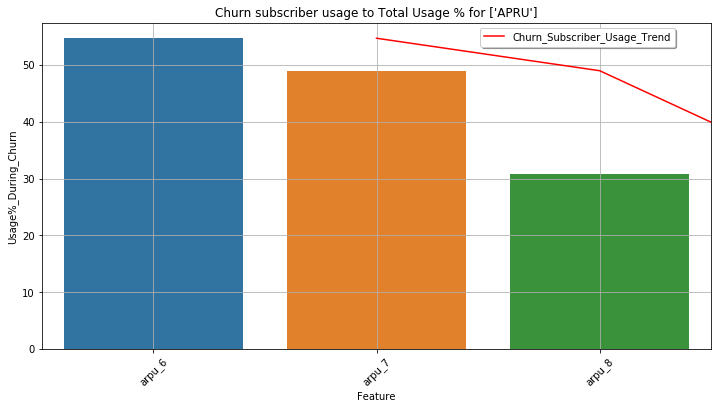

In [15]:
X1 = telecom.groupby('churn')['arpu_6'].agg(['mean']).reset_index()
X1.rename(columns={'mean': "arpu_6"}, inplace=True)

X2 = telecom.groupby(['churn'])['arpu_7'].agg(['mean']).reset_index()
X2.rename(columns={'mean': "arpu_7"}, inplace=True)
X3 = telecom.groupby(['churn'])['arpu_8'].agg(['mean']).reset_index()
X3.rename(columns={'mean': "arpu_8"}, inplace=True)

X1 = pd.merge(X1, X2, on = ['churn'])
X1 = pd.merge(X1,X3, on = ['churn'])
X1.head()
X1 = X1.transpose().reset_index()
X1 = X1.loc[1:]
X1.columns = ['Feature', 'Not-Churn', 'Churn']
X1['Usage%_During_Churn'] = round((X1['Churn']/(X1['Not-Churn'] + X1['Churn']))*100,2)
print(X1.head())
plt.figure(figsize=(12, 6))
ax = plt.subplot(111)
p = sns.barplot(x='Feature', y='Usage%_During_Churn', data=X1)
p.set_xticklabels(p.get_xticklabels(),rotation=45)
plt.title('Churn subscriber usage to Total Usage % for {}'.format(['APRU'][0:]), fontsize = 12)
X1.rename(columns={'Usage%_During_Churn':'Churn_Subscriber_Usage_Trend'}, inplace=True)
plt.plot(X1['Churn_Subscriber_Usage_Trend'], 'r-')    
ax.legend(loc='upper center', bbox_to_anchor=(0.8, 1.00), shadow=True, ncol=2, fontsize = 10)
plt.grid(True)
plt.show()



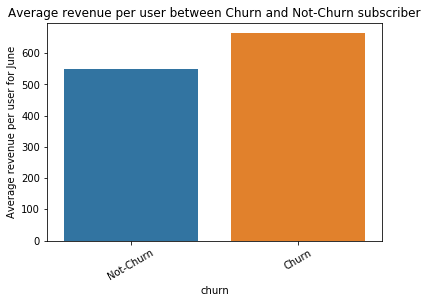

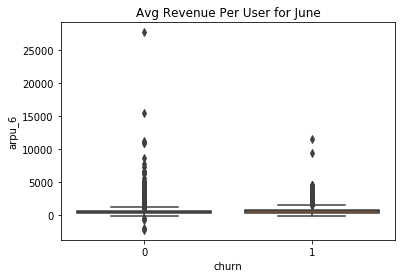

In [16]:
X1 = telecom.groupby('churn')['arpu_6'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Average revenue per user for June')
plt.title('Average revenue per user between Churn and Not-Churn subscriber')
plt.show()
#Box plot
sns.boxplot(x='churn',y='arpu_6', data=telecom)
#plt.yscale('log')
plt.title("Avg Revenue Per User for June")
plt.show()

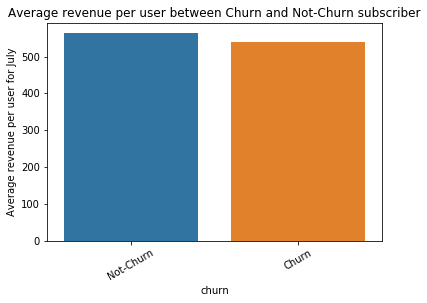

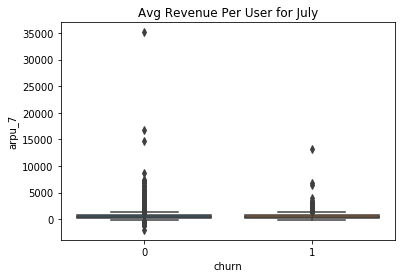

In [17]:
X1 = telecom.groupby('churn')['arpu_7'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Average revenue per user for July')
plt.title('Average revenue per user between Churn and Not-Churn subscriber')
plt.show()
#Box plot
sns.boxplot(x='churn',y='arpu_7', data=telecom)
#plt.yscale('log')
plt.title("Avg Revenue Per User for July")
plt.show()

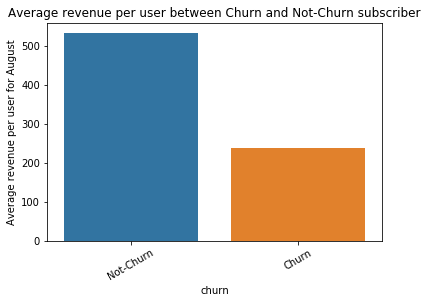

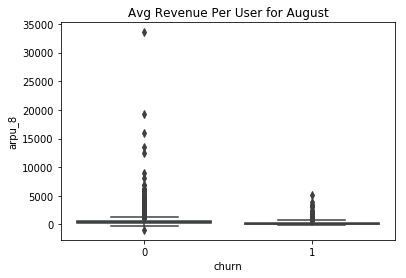

In [18]:
X1 = telecom.groupby('churn')['arpu_8'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Average revenue per user for August')
plt.title('Average revenue per user between Churn and Not-Churn subscriber')
plt.show()

#Box plot
sns.boxplot(x='churn',y='arpu_8', data=telecom)
#plt.yscale('log')
plt.title("Avg Revenue Per User for August")
plt.show()

#### Average Revenue per user (ARPU) is less in 8th month than 6th and 7th month.
Remove outliers
     1.Drop Record with arpu_6 more than 15000
     2.Drop Record with arpu_6 more than 20000
     3.Drop Record with arpu_6 more than 20000
     
     Drop Outlier for Non-Churn Subscriber

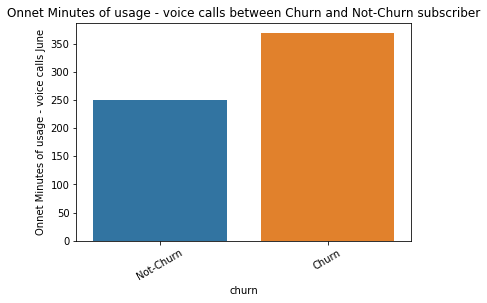

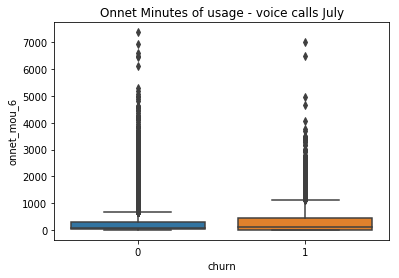

In [19]:
X1 = telecom.groupby('churn')['onnet_mou_6'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Onnet Minutes of usage - voice calls June')
plt.title('Onnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()
#Box plot
sns.boxplot(x='churn',y='onnet_mou_6', data=telecom)
#plt.yscale('log')
plt.title("Onnet Minutes of usage - voice calls July")
plt.show()

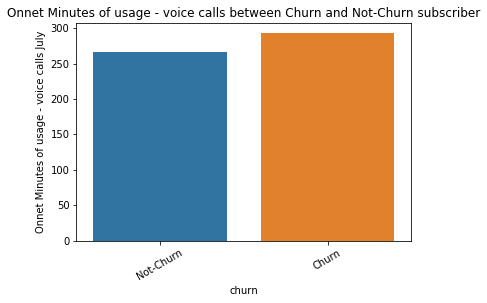

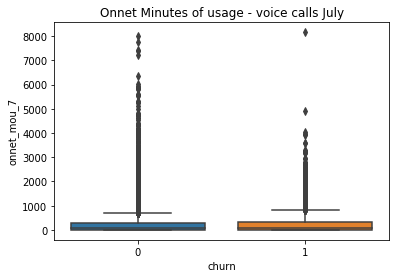

In [20]:
X1 = telecom.groupby('churn')['onnet_mou_7'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Onnet Minutes of usage - voice calls July')
plt.title('Onnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()
#Box plot
sns.boxplot(x='churn',y='onnet_mou_7', data=telecom)
#plt.yscale('log')
plt.title("Onnet Minutes of usage - voice calls July")
plt.show()

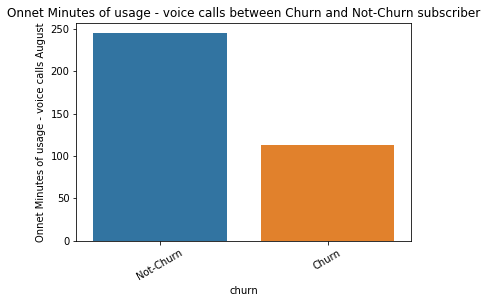

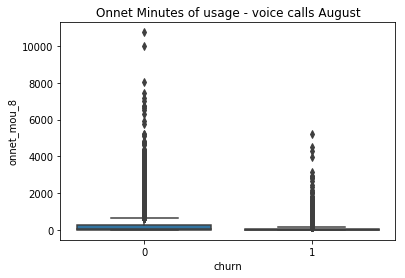

In [21]:
X1 = telecom.groupby('churn')['onnet_mou_8'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Onnet Minutes of usage - voice calls August')
plt.title('Onnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()

sns.boxplot(x='churn',y='onnet_mou_8', data=telecom)
#plt.yscale('log')
plt.title("Onnet Minutes of usage - voice calls August")
plt.show()

#### Onnet-Monthly-Usage (Onnet_MOU) is less in 8th Month than 6th and 7th Month.
   onnet_mou_8 more than 8000   
   offnet_mou_7 more than 9000   
   offnet_mou_8 more than 10000   

In [22]:
telecom = telecom.drop(telecom.loc[(telecom['churn'] == 0) & (
    (telecom['arpu_6'] > 15000) | (telecom['arpu_7'] > 20000) | (telecom['arpu_8'] > 20000) )].index)

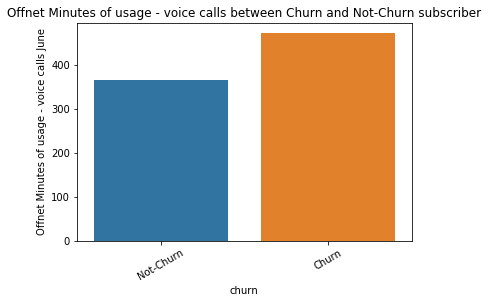

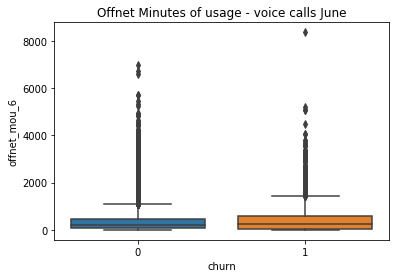

In [23]:
X1 = telecom.groupby('churn')['offnet_mou_6'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Offnet Minutes of usage - voice calls June')
plt.title('Offnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()

#Box plot
sns.boxplot(x='churn',y='offnet_mou_6', data=telecom)
#plt.yscale('log')
plt.title("Offnet Minutes of usage - voice calls June")
plt.show()

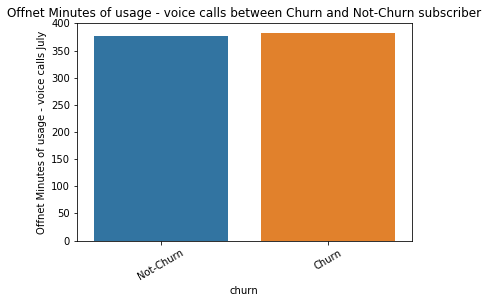

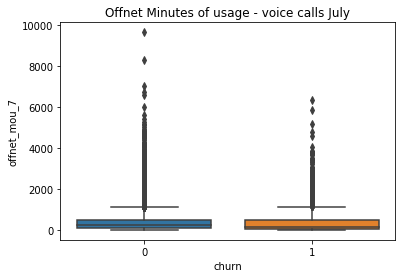

In [24]:
X1 = telecom.groupby('churn')['offnet_mou_7'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Offnet Minutes of usage - voice calls July')
plt.title('Offnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()
#Box plot
sns.boxplot(x='churn',y='offnet_mou_7', data=telecom)
#plt.yscale('log')
plt.title("Offnet Minutes of usage - voice calls July")
plt.show()

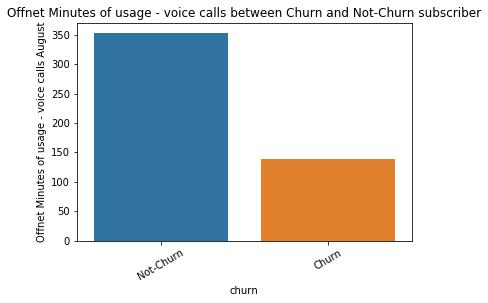

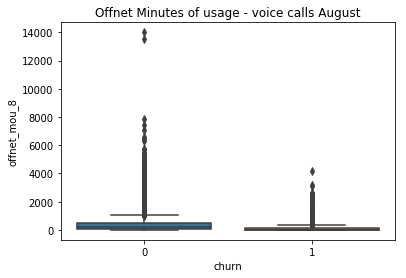

In [25]:
X1 = telecom.groupby('churn')['offnet_mou_8'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Offnet Minutes of usage - voice calls August')
plt.title('Offnet Minutes of usage - voice calls between Churn and Not-Churn subscriber')
plt.show()

#Boxplot
sns.boxplot(x='churn',y='offnet_mou_8', data=telecom)
#plt.yscale('log')
plt.title("Offnet Minutes of usage - voice calls August")
plt.show()

#### Offnet-Montly-Usage (Offnet_MOU) is less in 8th Month than 6th and 7th Month.
   

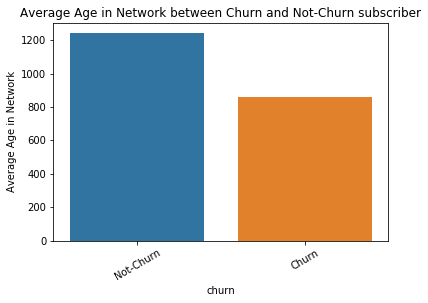

In [26]:
X1 = telecom.groupby('churn')['aon'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Average Age in Network')
plt.title('Average Age in Network between Churn and Not-Churn subscriber')
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3783eba8>,
      dtype=object)

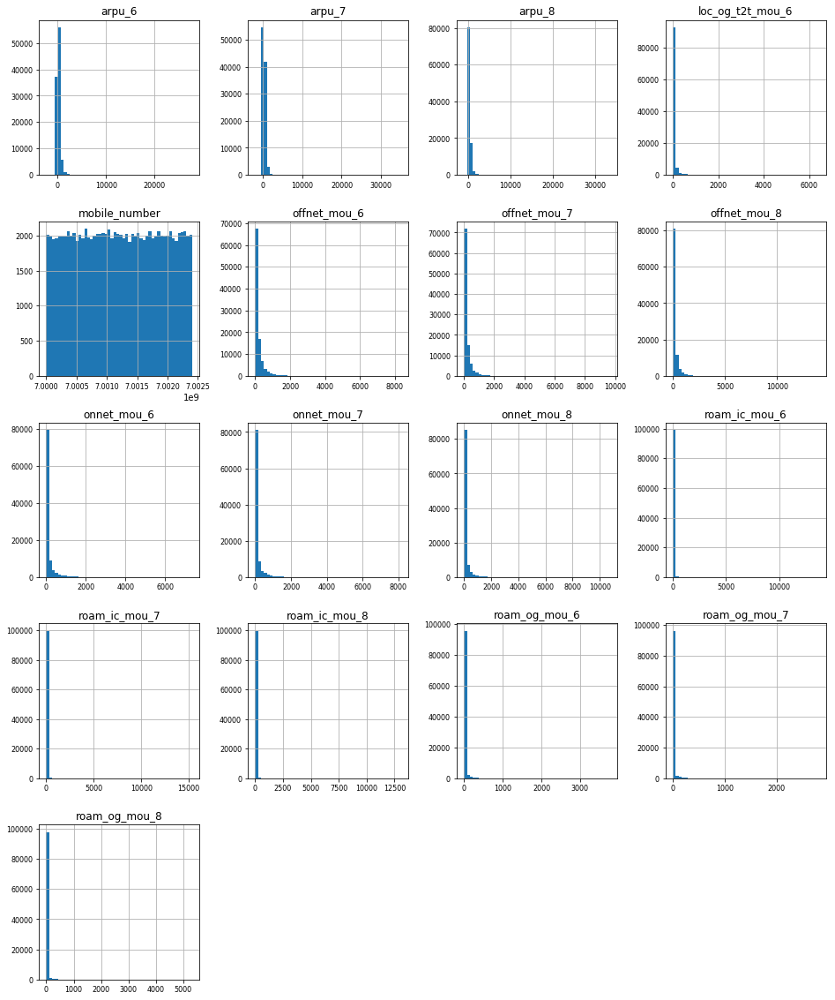

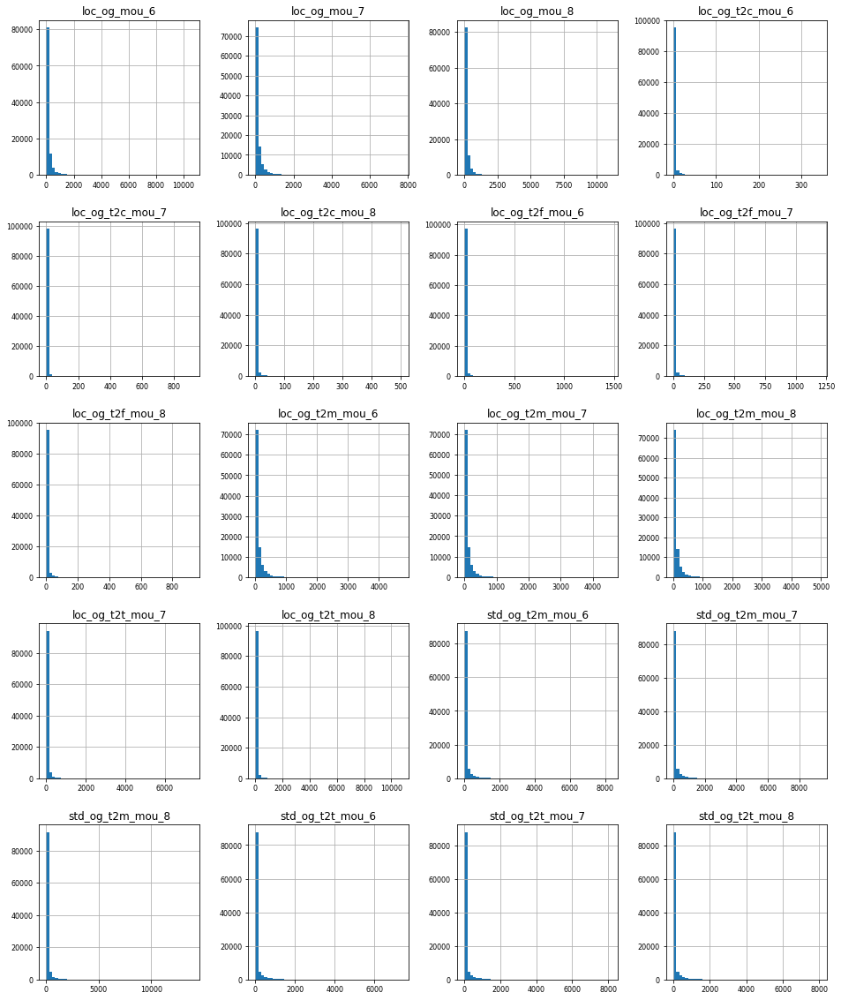

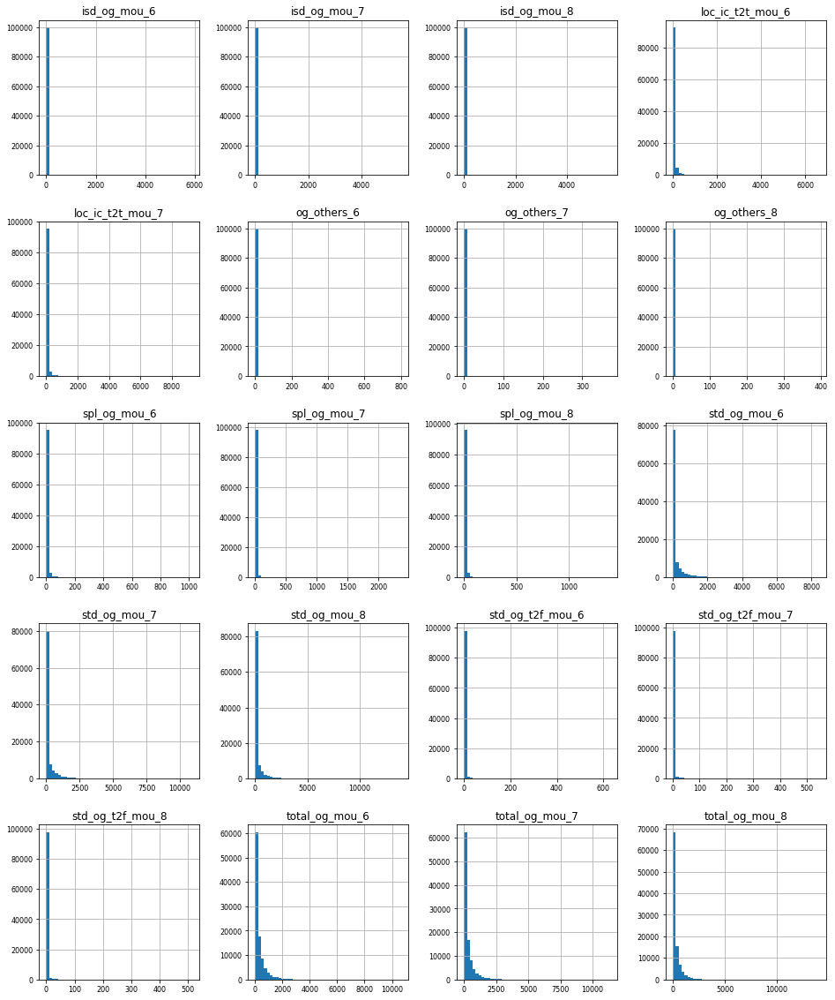

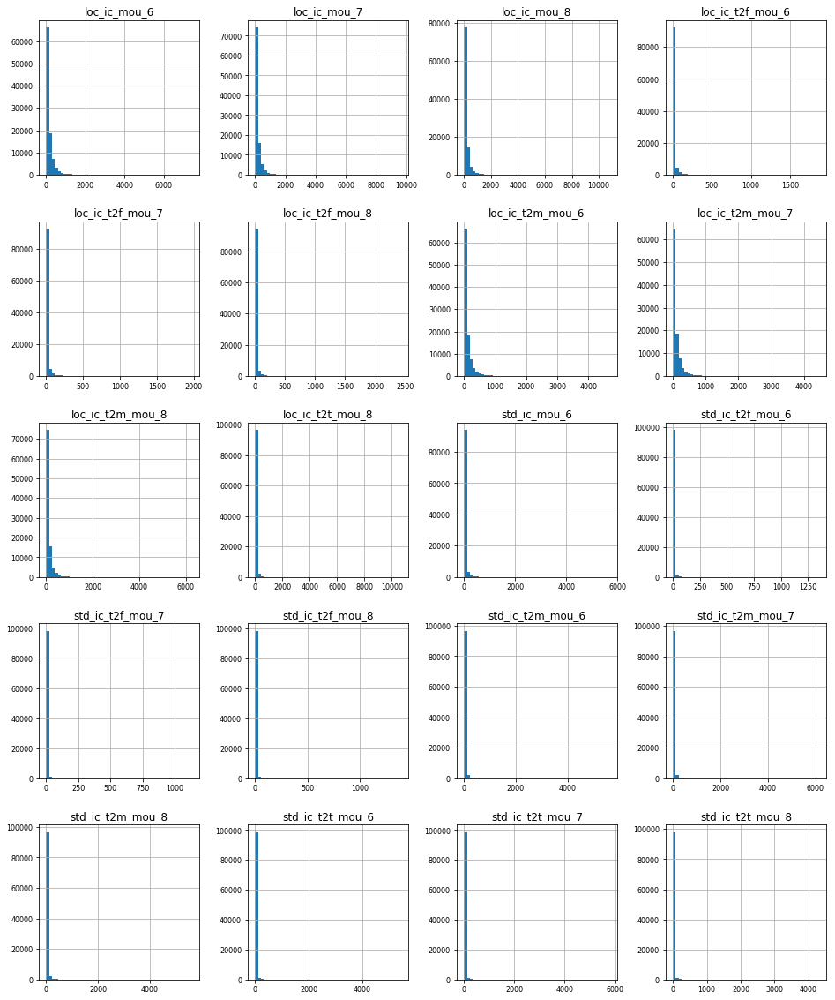

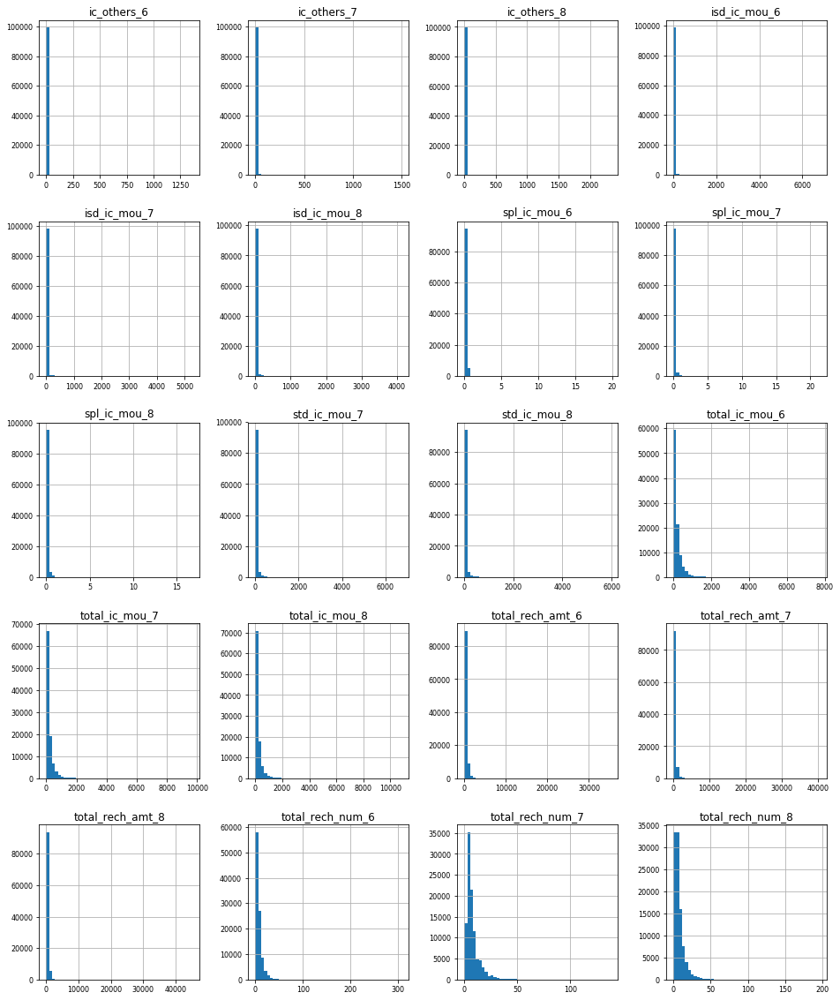

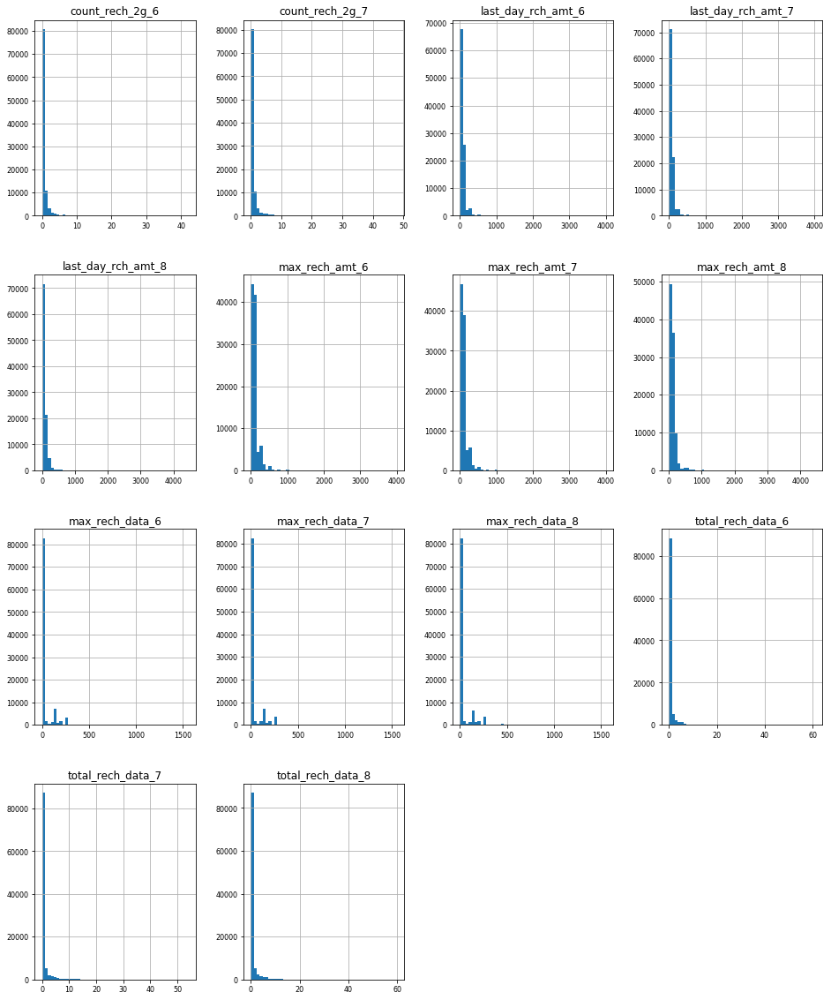

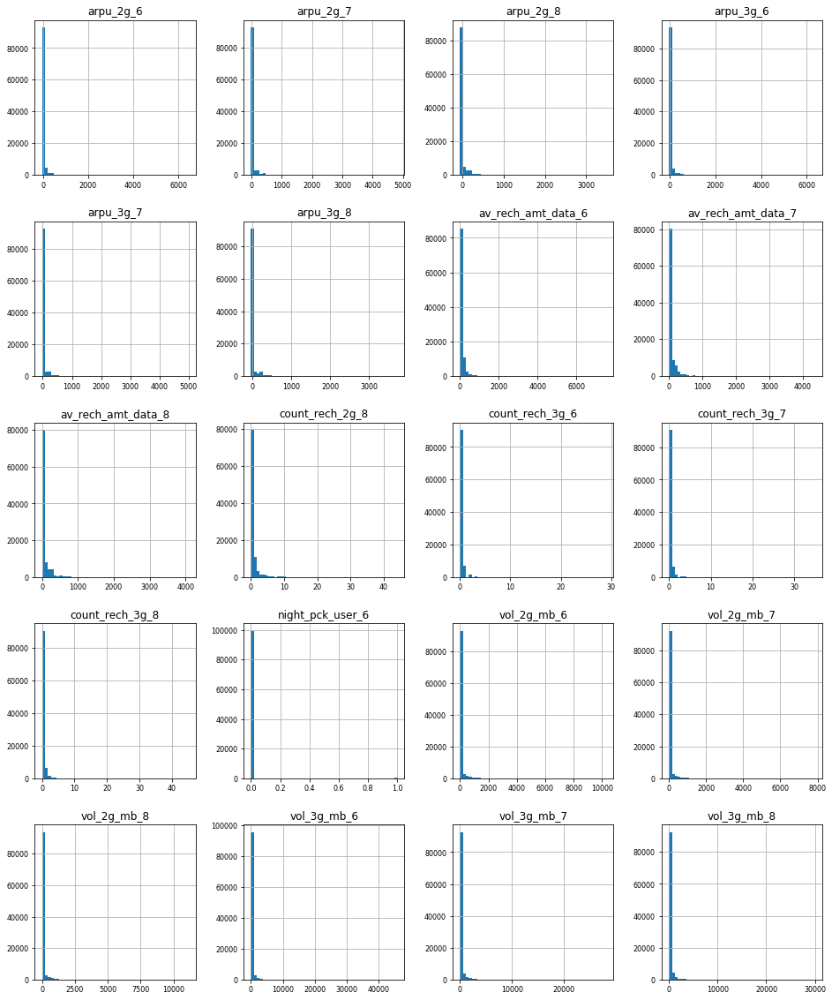

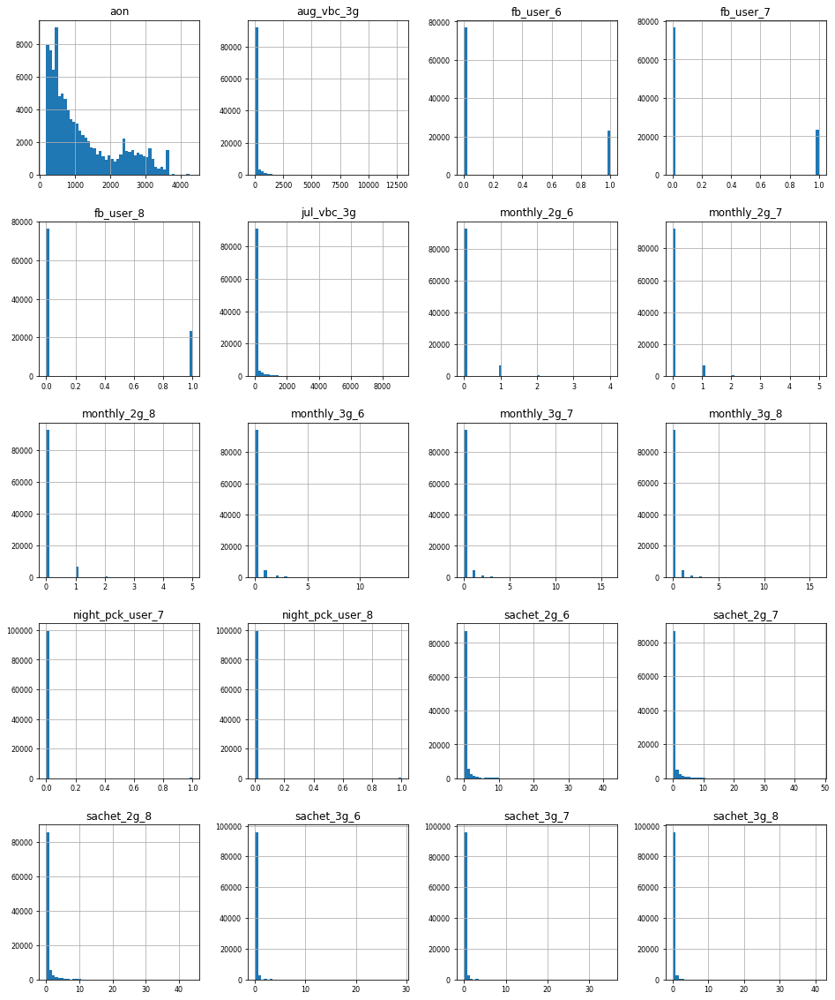

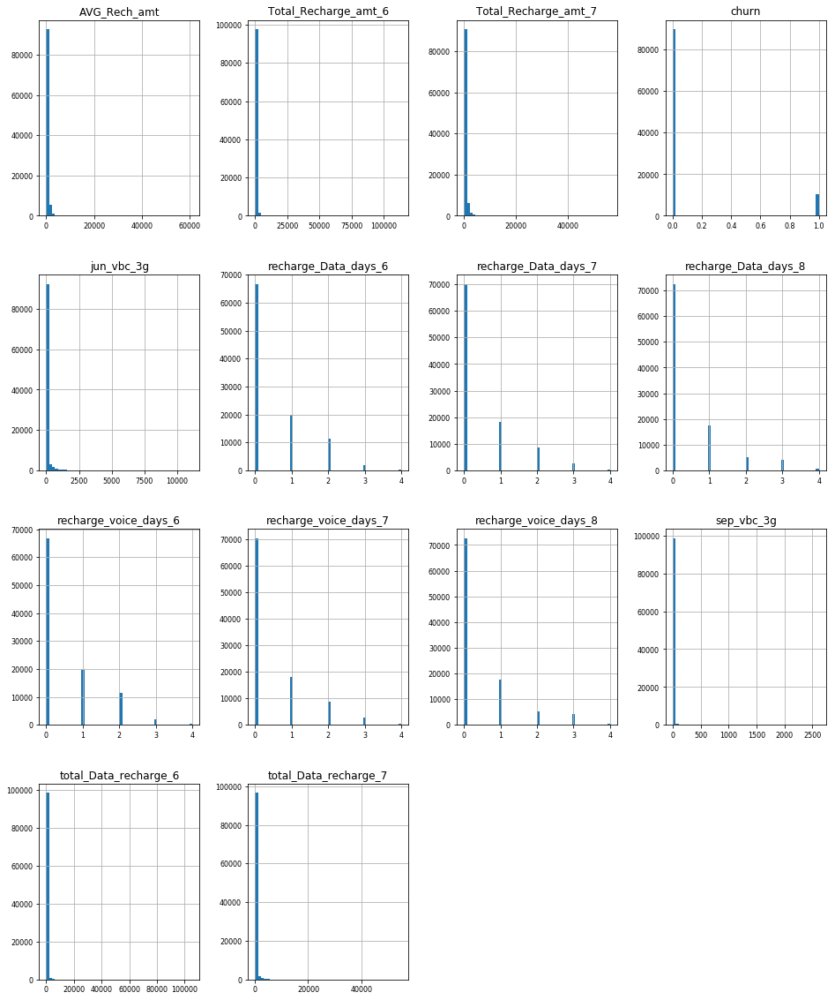

In [27]:
# Histogram 
churn_data.iloc[:,0:20].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,20:40].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,40:60].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,60:80].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,80:100].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,100:120].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,120:140].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,140:160].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
churn_data.iloc[:,160:].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)


#### Distribution of all the features is  skewed towards left,

/Users/Deepu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/Deepu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/Deepu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/Deepu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/Deepu/anaconda3/lib/python3.6

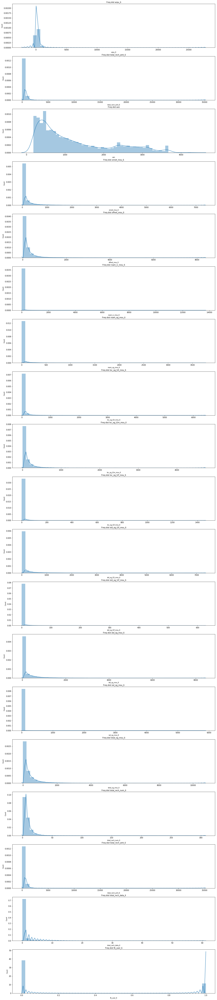

In [28]:
#Distribution for month 6
col_names = ['arpu_6','total_rech_amt_6','aon','onnet_mou_6','offnet_mou_6','roam_ic_mou_6','roam_og_mou_6','loc_og_t2t_mou_6',
             'loc_og_t2m_mou_6','loc_og_t2f_mou_6','std_og_t2t_mou_6','std_og_t2f_mou_6','std_og_mou_6','isd_og_mou_6',
             'total_og_mou_6','total_rech_num_6','total_rech_amt_6','total_rech_data_6','fb_user_6']

fig, ax = plt.subplots(len(col_names), figsize=(20,100))

for i, col_val in enumerate(col_names):

    sns.distplot(churn_data[col_val], hist=True, ax=ax[i])
    ax[i].set_title('Freq dist '+col_val, fontsize=10)
    ax[i].set_xlabel(col_val, fontsize=8)
    ax[i].set_ylabel('Count', fontsize=8)

plt.show()

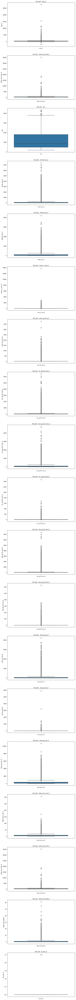

In [29]:
# Box Plot For month 6
col_names = ['arpu_6','total_rech_amt_6','aon','onnet_mou_6','offnet_mou_6','roam_ic_mou_6','roam_og_mou_6','loc_og_t2t_mou_6',
             'loc_og_t2m_mou_6','loc_og_t2f_mou_6','std_og_t2t_mou_6','std_og_t2f_mou_6','std_og_mou_6','isd_og_mou_6',
             'total_og_mou_6','total_rech_num_6','total_rech_amt_6','total_rech_data_6','fb_user_6']

fig, ax = plt.subplots(len(col_names), figsize=(10,150))

for i, col_val in enumerate(col_names):

    sns.boxplot(y=churn_data[col_val], ax=ax[i])
    ax[i].set_title('Box plot - {}'.format(col_val), fontsize=10)
    ax[i].set_xlabel(col_val, fontsize=8)

plt.show()

#### Presence of outliers is detected and need treatment for same 

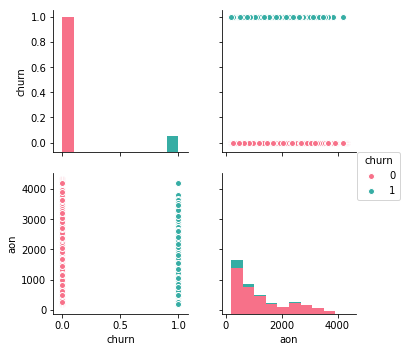

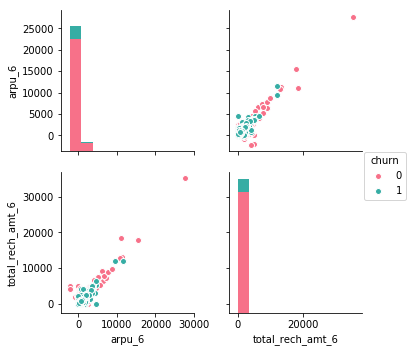

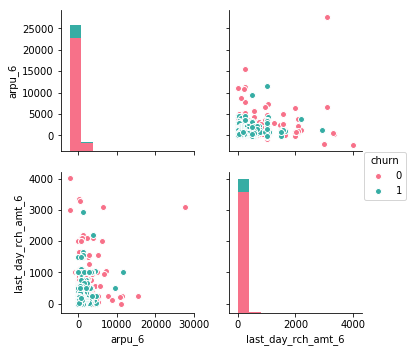

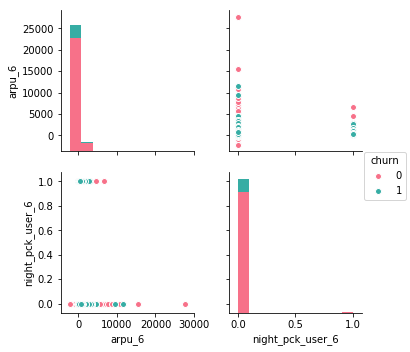

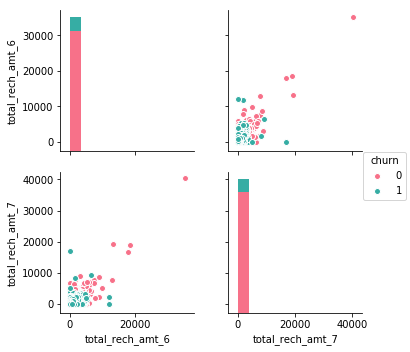

...

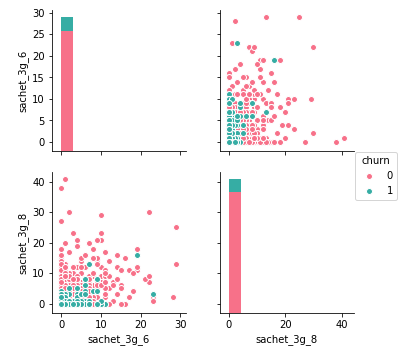

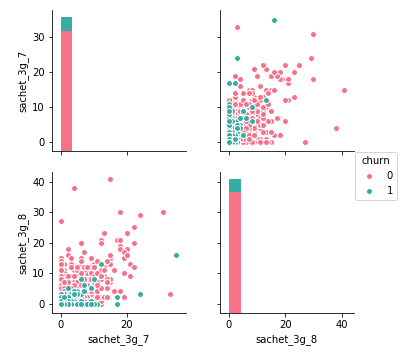

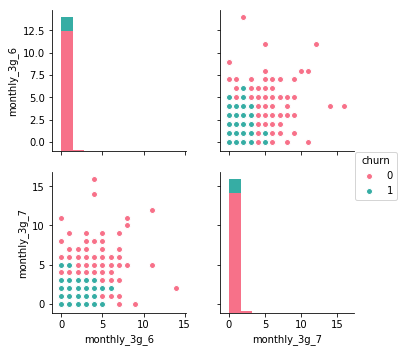

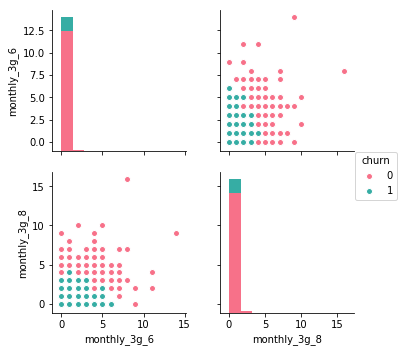

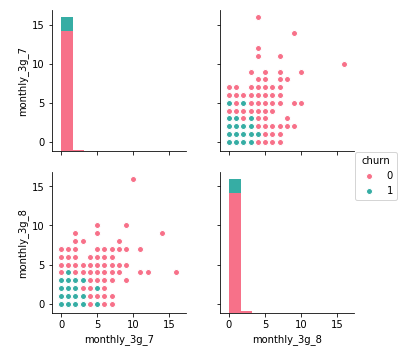

In [30]:
sns.pairplot(churn_data,vars=["churn", "aon"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["arpu_6","total_rech_amt_6"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["arpu_6","last_day_rch_amt_6"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["arpu_6","night_pck_user_6"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["total_rech_amt_6","total_rech_amt_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_amt_6","last_day_rch_amt_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_amt_7","total_rech_amt_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["onnet_mou_6","onnet_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["onnet_mou_6","onnet_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["onnet_mou_7","onnet_mou_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["loc_og_mou_6","loc_og_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["loc_og_mou_6","loc_og_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["loc_og_mou_7","loc_og_mou_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["std_og_mou_6","std_og_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["std_og_mou_6","std_og_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["std_og_mou_7","std_og_mou_8"],hue="churn",palette="husl");


sns.pairplot(churn_data,vars=["isd_og_mou_6","isd_og_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["isd_og_mou_6","isd_og_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["isd_og_mou_7","isd_og_mou_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["spl_og_mou_6","spl_og_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["spl_og_mou_6","spl_og_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["spl_og_mou_7","spl_og_mou_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["total_og_mou_6","total_og_mou_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_og_mou_6","total_og_mou_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_og_mou_7","total_og_mou_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["total_rech_num_6","total_rech_num_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_num_6","total_rech_num_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_num_7","total_rech_num_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["total_rech_amt_6","total_rech_amt_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_amt_6","total_rech_amt_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_rech_amt_7","total_rech_amt_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["vol_3g_mb_6","vol_3g_mb_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["vol_3g_mb_6","vol_3g_mb_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["vol_3g_mb_7","vol_3g_mb_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["night_pck_user_6","night_pck_user_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["night_pck_user_6","night_pck_user_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["night_pck_user_7","night_pck_user_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["sachet_3g_6","sachet_3g_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["sachet_3g_6","sachet_3g_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["sachet_3g_7","sachet_3g_8"],hue="churn",palette="husl");

sns.pairplot(churn_data,vars=["monthly_3g_6","monthly_3g_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["monthly_3g_6","monthly_3g_8"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["monthly_3g_7","monthly_3g_8"],hue="churn",palette="husl");




####  Recharge and Mou are the major dependent parameter for churn

Aon has no major effect on churn

if onnet_mou_6,onnet_mou_7,onnet_mou_8 is high, lower the probability of churn

We see similar trend for other usage feature

# Modelling (churn prediction)

## Dimensionality reduction using  PCA

In [31]:
churn = (sum(telecom['churn'])/len(telecom['churn'].index))*100
churn

8.136937897929931

Total Churn custimer is approx 8%, shows data is imbalanced

In [32]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29999 entries, 0 to 99997
Columns: 161 entries, arpu_6 to total_Data_recharge_7
dtypes: float64(129), int64(32)
memory usage: 38.3 MB


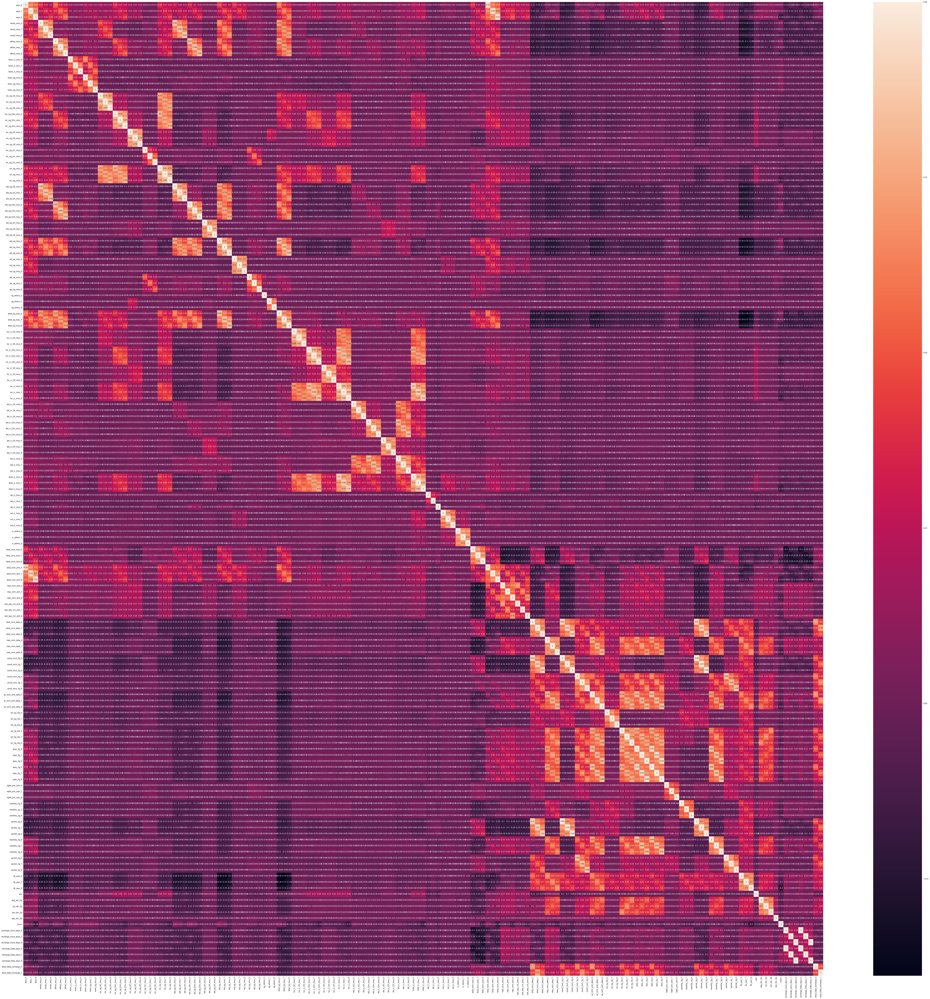

In [33]:


# Let's see the correlation matrix 
plt.figure(figsize = (100,100))        # Size of the figure
sns.heatmap(telecom.corr(),annot = True)

In [34]:
#from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = telecom.drop(['churn'],axis=1)

# Putting response variable to y
y = telecom['churn']


In [35]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

## Class imbalance Handling  using SMOTE Techniques.

In [36]:
#from sklearn import preprocessing
X_scaler = preprocessing.StandardScaler().fit(X_train)
y_scaler = preprocessing.StandardScaler().fit(y_train.values.reshape(-1,1))
Xtrain=X_scaler.transform(X_train) 
ytrain=y_scaler.transform(y_train.values.reshape(-1,1)) 

Xtest=X_scaler.transform(X_test) 
ytest=y_scaler.transform(y_test.values.reshape(-1,1))


#from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=2)
X_train, y_train = sm.fit_sample(X_train, y_train.ravel())

/Users/Deepu/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/Deepu/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/Deepu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.
/Users/Deepu/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/Deepu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: Dat

In [37]:
#Improting the PCA module
#from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [38]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

In [39]:
pca.components_

array([[-6.99201391e-02, -7.18461996e-02, -4.40039622e-02, ...,
         2.39929986e-05,  3.82565172e-01,  3.97114052e-01],
       [ 1.15436935e-01,  1.50136452e-01,  1.30065426e-01, ...,
        -4.76866008e-05,  3.34322287e-01,  4.19166904e-01],
       [-1.85234149e-02, -1.29527555e-01, -2.19433771e-01, ...,
         5.69616040e-05,  3.24945120e-01,  1.41844960e-01],
       ...,
       [-0.00000000e+00, -2.62473228e-18, -2.45133239e-18, ...,
         4.56366331e-01,  9.44060464e-20, -1.70698991e-19],
       [-0.00000000e+00,  2.43182759e-18, -6.63939831e-19, ...,
        -5.41384371e-16, -1.10018573e-19, -4.26017430e-20],
       [-0.00000000e+00, -2.74321043e-18, -1.56430307e-18, ...,
         3.46305171e-02,  9.22574347e-19, -2.42130306e-18]])

## Analysis on PCA

In [40]:
colnames = list(X_test.columns)
pcs_telecom = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_telecom.head()

,PC1,PC2,Feature
0,-0.069920,0.115437,arpu_6
1,-0.071846,0.150136,arpu_7
2,-0.044004,0.130065,arpu_8
3,-0.133187,0.108561,onnet_mou_6
4,-0.132916,0.126811,onnet_mou_7


In [41]:
pcs_telecom[["PC1","Feature"]].sort_values(by=['PC1'], ascending=False)

,PC1,Feature
159,0.397114,total_Data_recharge_7
158,0.382565,total_Data_recharge_6
121,0.242711,vol_3g_mb_7
120,0.237811,vol_3g_mb_6
122,0.181338,vol_3g_mb_8
149,0.077992,jul_vbc_3g
150,0.076659,jun_vbc_3g
114,0.062498,av_rech_amt_data_6
115,0.062403,av_rech_amt_data_7
148,0.057104,aug_vbc_3g


In [42]:
pcs_telecom[["PC2","Feature"]].sort_values(by=['PC2'], ascending=False)

,PC2,Feature
159,0.419167,total_Data_recharge_7
158,0.334322,total_Data_recharge_6
121,0.271092,vol_3g_mb_7
52,0.255173,total_og_mou_7
120,0.229095,vol_3g_mb_6
122,0.219880,vol_3g_mb_8
40,0.219253,std_og_mou_7
51,0.210467,total_og_mou_6
53,0.190428,total_og_mou_8
39,0.184689,std_og_mou_6


In [43]:
telecom[telecom["churn"]==1][['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','total_og_mou_6','total_og_mou_7','total_og_mou_8','std_og_mou_6','std_og_mou_7','offnet_mou_6','offnet_mou_7','total_rech_amt_7','onnet_mou_6','onnet_mou_7','std_og_t2m_mou_7','std_og_t2t_mou_6','std_og_t2t_mou_7']]

,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,std_og_mou_6,std_og_mou_7,offnet_mou_6,offnet_mou_7,total_rech_amt_7,onnet_mou_6,onnet_mou_7,std_og_t2m_mou_7,std_og_t2t_mou_6,std_og_t2t_mou_7
0,83.57,150.76,109.61,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252,0.00,0.00,0.00,0.00,0.00
7,0.00,0.00,0.00,487.53,609.24,350.16,60.86,75.14,453.43,567.16,790,57.84,54.68,31.76,4.30,23.29
67,2042.38,3189.85,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,455,0.00,0.00,0.00,0.00,0.00
86,1883.48,0.00,0.00,324.53,41.76,0.00,262.29,13.10,182.76,32.79,110,141.76,11.23,13.10,89.21,0.00
111,0.00,0.00,0.00,102.01,18.33,0.00,1.30,0.00,45.51,12.34,178,55.19,3.26,0.00,0.00,0.00
188,1522.40,0.00,0.00,109.54,40.38,0.00,0.00,0.00,105.16,39.39,120,4.38,0.98,0.00,0.00,0.00
199,0.00,0.00,0.00,477.66,1719.56,743.46,362.86,1681.99,186.59,1326.06,846,288.56,376.66,1307.19,261.33,374.79
320,0.00,0.00,0.00,2221.43,2788.91,411.38,8.94,1.19,2082.18,2532.03,2023,120.19,236.14,0.89,0.38,0.30
358,418.14,16.68,0.00,556.59,248.61,0.00,362.94,62.54,550.18,209.68,500,68.34,38.93,40.93,32.46,21.61
428,627.05,202.24,103.93,16.54,30.29,17.74,11.96,7.99,12.39,2.89,124,2.76,22.66,0.00,1.51,7.99


#### From the trend its observed recharge and MOU realted paramter in decreasingTrend  for churn customer,So extended the observation for 8th month

In [44]:
telecom[telecom["churn"]==1][['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','total_og_mou_6','total_og_mou_7','total_og_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','onnet_mou_6','onnet_mou_7','onnet_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8']]

,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8
0,83.57,150.76,109.61,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
7,0.00,0.00,0.00,487.53,609.24,350.16,60.86,75.14,77.84,453.43,567.16,325.91,57.84,54.68,52.29,4.30,23.29,12.01
67,2042.38,3189.85,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
86,1883.48,0.00,0.00,324.53,41.76,0.00,262.29,13.10,0.00,182.76,32.79,1.71,141.76,11.23,0.00,89.21,0.00,0.00
111,0.00,0.00,0.00,102.01,18.33,0.00,1.30,0.00,0.00,45.51,12.34,0.00,55.19,3.26,0.00,0.00,0.00,0.00
188,1522.40,0.00,0.00,109.54,40.38,0.00,0.00,0.00,0.00,105.16,39.39,0.00,4.38,0.98,0.00,0.00,0.00,0.00
199,0.00,0.00,0.00,477.66,1719.56,743.46,362.86,1681.99,667.48,186.59,1326.06,771.14,288.56,376.66,111.61,261.33,374.79,101.78
320,0.00,0.00,0.00,2221.43,2788.91,411.38,8.94,1.19,0.00,2082.18,2532.03,408.54,120.19,236.14,1.71,0.38,0.30,0.00
358,418.14,16.68,0.00,556.59,248.61,0.00,362.94,62.54,0.00,550.18,209.68,0.00,68.34,38.93,0.00,32.46,21.61,0.00
428,627.05,202.24,103.93,16.54,30.29,17.74,11.96,7.99,14.83,12.39,2.89,13.29,2.76,22.66,4.10,1.51,7.99,2.81


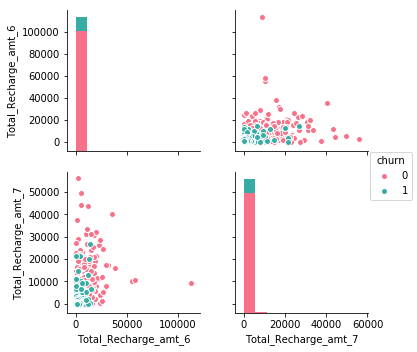

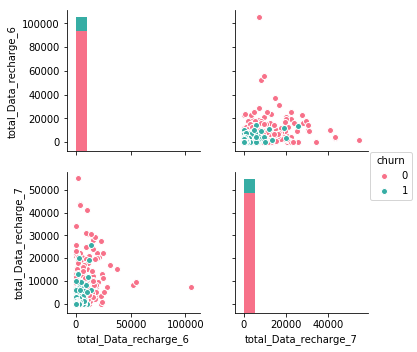

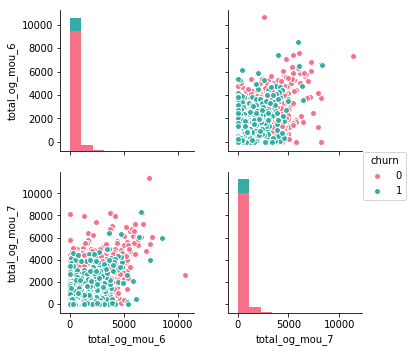

In [45]:
sns.pairplot(churn_data,vars=["Total_Recharge_amt_6","Total_Recharge_amt_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_Data_recharge_6","total_Data_recharge_7"],hue="churn",palette="husl");
sns.pairplot(churn_data,vars=["total_og_mou_6","total_og_mou_7"],hue="churn",palette="husl");
plt.show()

#### Major factor is total rechage data and voice  amount 6,7
     Outgoing calls for 

If recharge amount is high in 

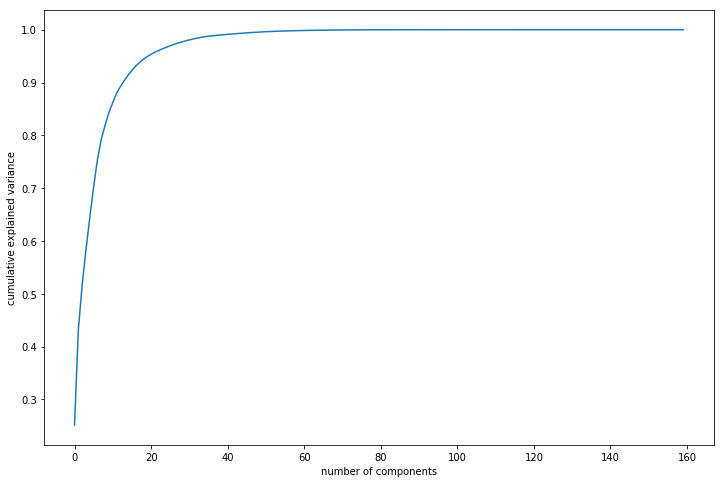

In [47]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [48]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
#from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=23)
pca_final

IncrementalPCA(batch_size=None, copy=True, n_components=23, whiten=False)

In [49]:
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(38622, 23)

In [50]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = False)

#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [51]:
#Applying selected components to the test data - 16 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9000, 23)

### Applying a logistic regression on our Principal Components¶

In [52]:
#Training the model on the train data
#from sklearn.linear_model import LogisticRegression
#from sklearn import metrics

learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train)

In [53]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.86'

In [54]:
pca_again = PCA(0.90)

In [55]:
df_train_pca2 = pca_again.fit_transform(X_train)
df_train_pca2.shape
# we see that PCA selected 14 components

(38622, 14)

In [56]:
#training the regression model
learner_pca2 = LogisticRegression()
model_pca2 = learner_pca2.fit(df_train_pca2,y_train)

In [57]:
df_test_pca2 = pca_again.transform(X_test)
df_test_pca2.shape

(9000, 14)

In [58]:
#Making prediction on the test data
pred_probs_test2 = model_pca2.predict_proba(df_test_pca2)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test2))

'0.85'

## Now try with Binary Tree option

In [59]:
# Importing decision tree classifier from sklearn library
#from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.2345678
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(df_train_pca, y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [60]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
#from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred_default = dt_default.predict(df_test_pca)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       0.97      0.80      0.87      8247
           1       0.25      0.73      0.37       753

   micro avg       0.79      0.79      0.79      9000
   macro avg       0.61      0.76      0.62      9000
weighted avg       0.91      0.79      0.83      9000



In [61]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[6571 1676]
 [ 202  551]]
0.7913333333333333


# Hyperparameter Tuning for Decision Tree

In [120]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 14)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(2, 30, 2)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [121]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.193222,0.007026,0.001390,0.000270,2,{'max_depth': 2},0.704245,0.712714,0.713490,0.710124,...,0.709492,0.003495,14,0.707341,0.716648,0.716487,0.707813,0.712409,0.712139,0.004026
1,0.359925,0.003256,0.001420,0.000133,4,{'max_depth': 4},0.768444,0.777835,0.773692,0.776152,...,0.773497,0.003347,13,0.780943,0.778626,0.778400,0.780439,0.776361,0.778954,0.001631
2,0.519383,0.003463,0.002094,0.000729,6,{'max_depth': 6},0.796402,0.801916,0.801528,0.795443,...,0.800606,0.004423,12,0.814571,0.812188,0.813580,0.809535,0.811606,0.812296,0.001729
3,0.692701,0.016078,0.001816,0.000278,8,{'max_depth': 8},0.821641,0.823149,0.822890,0.820300,...,0.823624,0.003412,11,0.850952,0.847660,0.845653,0.844326,0.852871,0.848292,0.003198
4,0.926256,0.017524,0.001967,0.000393,10,{'max_depth': 10},0.847140,0.843993,0.842957,0.837131,...,0.843716,0.003715,10,0.890083,0.886789,0.887145,0.881157,0.893068,0.887648,0.003960
5,1.027747,0.022190,0.003097,0.001363,12,{'max_depth': 12},0.862024,0.857198,0.855774,0.850984,...,0.855885,0.003726,9,0.927207,0.925562,0.923814,0.919218,0.927957,0.924751,0.003113
6,1.131414,0.033125,0.002538,0.000451,14,{'max_depth': 14},0.871214,0.869109,0.866390,0.860823,...,0.867355,0.003609,8,0.956046,0.953751,0.952715,0.954269,0.957635,0.954883,0.001748
7,1.187098,0.009027,0.002315,0.000280,16,{'max_depth': 16},0.877945,0.873123,0.868462,0.868980,...,0.872430,0.003464,7,0.973751,0.972231,0.971810,0.973040,0.975986,0.973364,0.001471
8,1.265161,0.068924,0.002489,0.000247,18,{'max_depth': 18},0.880792,0.874676,0.870145,0.870533,...,0.874553,0.003970,4,0.985176,0.984336,0.983656,0.985663,0.986439,0.985054,0.000977
9,1.275601,0.035969,0.002556,0.000421,20,{'max_depth': 20},0.880663,0.872475,0.868203,0.874676,...,0.873984,0.004020,5,0.990387,0.990679,0.990194,0.991294,0.991391,0.990789,0.000479


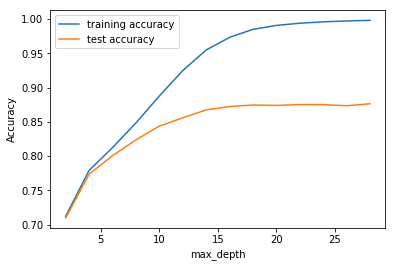

In [122]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [97]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(max_depth=12, criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=12,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [98]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.948619,0.046746,0.002045,0.000237,5,{'min_samples_leaf': 5},0.851023,0.852020,0.852796,0.846453,...,0.849749,0.002749,1,0.913808,0.912066,0.911548,0.906920,0.914104,0.911689,0.002578
1,0.897499,0.027780,0.001959,0.000223,25,{'min_samples_leaf': 25},0.830313,0.834283,0.836225,0.832082,...,0.833799,0.002302,2,0.872378,0.874620,0.871286,0.870348,0.875008,0.872728,0.001825
2,0.862345,0.057328,0.001983,0.000181,45,{'min_samples_leaf': 45},0.822159,0.828975,0.827421,0.830658,...,0.827715,0.002964,3,0.853088,0.854489,0.855201,0.853324,0.858049,0.854830,0.001784
3,0.787462,0.013463,0.001917,0.000365,65,{'min_samples_leaf': 65},0.818923,0.826644,0.827033,0.817582,...,0.822226,0.003918,4,0.844284,0.844585,0.843356,0.840410,0.844165,0.843360,0.001530
4,0.825223,0.029569,0.002214,0.000438,85,{'min_samples_leaf': 85},0.810769,0.823019,0.819394,0.810331,...,0.815390,0.005000,5,0.835577,0.836753,0.835685,0.831413,0.838307,0.835547,0.002288


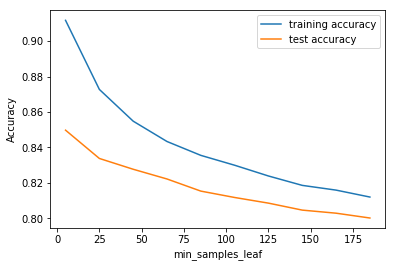

In [99]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [100]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(max_depth=15, min_samples_leaf = 5, criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=15,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [101]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.059400,0.029032,0.002137,0.000106,5,{'min_samples_split': 5},0.864225,0.857975,0.855774,0.859399,...,0.860080,0.003140,1,0.940542,0.937569,0.940028,0.939770,0.943686,0.940319,0.001966
1,1.059069,0.042574,0.002008,0.000116,25,{'min_samples_split': 25},0.856200,0.849301,0.851243,0.848783,...,0.851561,0.002644,2,0.921479,0.918797,0.920804,0.919315,0.922455,0.920570,0.001353
2,1.049995,0.040640,0.002169,0.000233,45,{'min_samples_split': 45},0.841574,0.842180,0.842698,0.837131,...,0.842680,0.004080,3,0.902059,0.903133,0.901223,0.901256,0.908311,0.903196,0.002650
3,1.008344,0.018201,0.001952,0.000145,65,{'min_samples_split': 65},0.837432,0.837131,0.833894,0.830399,...,0.836906,0.005072,4,0.889824,0.892388,0.891287,0.889119,0.897696,0.892063,0.003037
4,0.992737,0.013921,0.001947,0.000087,85,{'min_samples_split': 85},0.833549,0.833506,0.834671,0.830140,...,0.833981,0.002534,5,0.878496,0.884361,0.885171,0.882549,0.886336,0.883382,0.002737


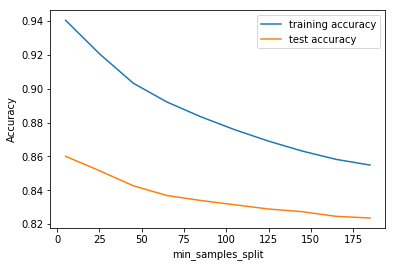

In [102]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# Grid Search to Find Optimal Hyperparameters

In [103]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(10, 16, 2),
    'min_samples_leaf': range(5, 15, 5),
    'min_samples_split': range(5, 15, 5),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(df_train_pca,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  2.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(10, 16, 2), 'min_samples_leaf': range(5, 15, 5), 'min_samples_split': range(5, 15, 5), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [104]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.175933,0.017221,0.001822,0.000074,entropy,10,5,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.830831,...,0.836881,0.003185,19,0.875291,0.874976,0.880219,0.873940,0.878568,0.876599,0.002383
1,1.195647,0.030771,0.001890,0.000081,entropy,10,5,10,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.831090,...,0.836777,0.003092,20,0.875291,0.875073,0.879669,0.873875,0.878503,0.876482,0.002211
2,1.187325,0.020930,0.001963,0.000306,entropy,10,10,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.828242,...,0.834757,0.003512,23,0.870954,0.868082,0.873293,0.868373,0.872387,0.870618,0.002091
3,1.170805,0.014525,0.001921,0.000151,entropy,10,10,10,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.827854,...,0.834732,0.003661,24,0.870954,0.867953,0.873714,0.868373,0.872354,0.870670,0.002229
4,1.284830,0.031738,0.002410,0.000890,entropy,12,5,5,"{'criterion': 'entropy', 'max_depth': 12, 'min...",0.848046,...,0.850681,0.002902,5,0.907528,0.902227,0.909509,0.905787,0.915593,0.908129,0.004434


In [105]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8586039045103827
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=14,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


## Running the model with best parameters obtained from grid search.

In [111]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=14, 
                                  min_samples_leaf=5,
                                  min_samples_split=10)
clf_gini.fit(df_train_pca, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=14,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [112]:
# accuracy score
clf_gini.score(df_test_pca,y_test)

0.8234444444444444

## Now We Will Try Random Forest

In [79]:
# Importing random forest classifier from sklearn library
#from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [80]:
# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [81]:
# Making predictions
predictions = rfc.predict(df_test_pca)

In [82]:
# Importing classification report and confusion matrix from sklearn metrics
#from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [83]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      8247
           1       0.42      0.50      0.46       753

   micro avg       0.90      0.90      0.90      9000
   macro avg       0.69      0.72      0.70      9000
weighted avg       0.91      0.90      0.90      9000



In [84]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[7732  515]
 [ 378  375]]


In [85]:
print(accuracy_score(y_test,predictions))

0.9007777777777778


# Hyper Parameter Tuning

In [114]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(10, 28, 2)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(10, 28, 2)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [144]:
#scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.278782,0.063054,0.019766,0.003692,10,{'min_samples_split': 10},0.927259,0.966598,0.967374,0.968022,...,0.959453,0.016108,1,0.994498,0.992071,0.992038,0.991974,0.990744,0.992265,0.001223
1,2.262466,0.131586,0.018210,0.002258,30,{'min_samples_split': 30},0.918845,0.955852,0.959089,0.959606,...,0.950469,0.015869,2,0.984140,0.974497,0.976600,0.976471,0.975435,0.977429,0.003441
2,2.191540,0.039731,0.015113,0.000515,50,{'min_samples_split': 50},0.914445,0.955463,0.956629,0.955334,...,0.947103,0.016359,3,0.975013,0.966665,0.969092,0.968865,0.966470,0.969221,0.003092
3,2.119887,0.043969,0.015243,0.000605,70,{'min_samples_split': 70},0.907326,0.951191,0.949249,0.946919,...,0.940785,0.016786,4,0.966792,0.961227,0.961421,0.962004,0.960451,0.962379,0.002262
4,2.124318,0.051031,0.015446,0.000612,90,{'min_samples_split': 90},0.909267,0.947825,0.942905,0.943294,...,0.937782,0.014368,5,0.963134,0.954884,0.954204,0.955337,0.954075,0.956327,0.003435


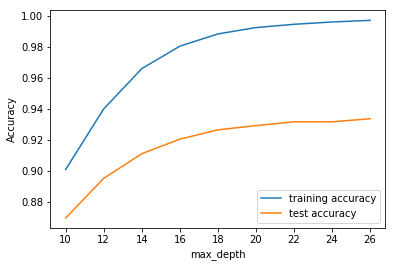

In [116]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
#plt.yscale('log')
plt.legend()
plt.show()



We choose max_depth = 20

In [117]:
# GridSearchCV to find optimal n_estimators
#from sklearn.model_selection import KFold
#from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1000, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=20)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': range(100, 1000, 400)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [118]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,13.369583,0.201895,0.159888,0.005875,100,{'n_estimators': 100},0.943308,0.943553,0.941740,0.945236,...,0.943530,0.001117,3,0.995242,0.995954,0.995793,0.995793,0.995728,0.995702,0.000242
1,66.544777,1.073126,0.757729,0.018832,500,{'n_estimators': 500},0.946674,0.945624,0.941222,0.946401,...,0.945005,0.001972,1,0.995566,0.996310,0.995954,0.996343,0.996310,0.996097,0.000301
2,118.677339,5.085768,1.380701,0.091719,900,{'n_estimators': 900},0.946285,0.945495,0.940316,0.945236,...,0.944513,0.002134,2,0.995566,0.995987,0.996084,0.996343,0.996375,0.996071,0.000293


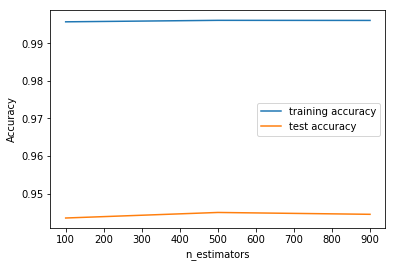

In [119]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

n_estimators = 500

In [126]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [3, 5, 7, 9]}

# instantiate the model
rf = RandomForestClassifier(max_depth=20)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_features': [3, 5, 7, 9]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [127]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.636104,0.017247,0.020644,0.001679,3,{'max_features': 3},0.930883,0.960642,0.962325,0.961419,...,0.956087,0.012697,4,0.994271,0.993592,0.993559,0.993624,0.993559,0.993721,0.000276
1,0.902442,0.007696,0.018947,0.000796,5,{'max_features': 5},0.928941,0.965044,0.965432,0.966209,...,0.958599,0.014852,3,0.995145,0.994110,0.993624,0.993333,0.993657,0.993974,0.000636
2,1.263046,0.046337,0.019956,0.000750,7,{'max_features': 7},0.933083,0.968281,0.966857,0.966598,...,0.960515,0.013731,1,0.994174,0.993074,0.992265,0.992880,0.993268,0.993132,0.000620
3,1.610846,0.072630,0.019065,0.001629,9,{'max_features': 9},0.930624,0.968022,0.966727,0.966339,...,0.959634,0.014519,2,0.993753,0.993009,0.993786,0.992945,0.992394,0.993177,0.000529


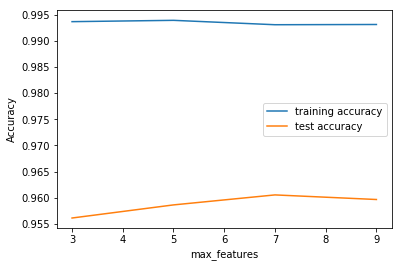

In [128]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

max_features = 7

In [135]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(10, 100, 20)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': range(10, 100, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [136]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.951538,0.097115,0.019594,0.004375,10,{'min_samples_leaf': 10},0.918069,0.953910,0.954557,0.952227,...,0.946222,0.014107,1,0.973233,0.966050,0.965629,0.965888,0.966211,0.967402,0.002922
1,1.603103,0.025155,0.014536,0.001178,30,{'min_samples_leaf': 30},0.902796,0.938762,0.939410,0.935137,...,0.930428,0.013911,2,0.949281,0.941258,0.941614,0.942877,0.940579,0.943122,0.003169
2,1.493169,0.024259,0.013786,0.001203,50,{'min_samples_leaf': 50},0.900078,0.929441,0.929441,0.926981,...,0.923929,0.012123,3,0.942128,0.930546,0.929639,0.931225,0.932908,0.933289,0.004547
3,1.408564,0.057341,0.014205,0.001836,70,{'min_samples_leaf': 70},0.893347,0.922320,0.927758,0.919213,...,0.918647,0.013267,4,0.934069,0.922196,0.923587,0.922260,0.925691,0.925561,0.004439
4,1.385381,0.053157,0.014241,0.001885,90,{'min_samples_leaf': 90},0.891923,0.917918,0.918954,0.919213,...,0.913003,0.010570,5,0.931286,0.917309,0.917082,0.920480,0.916338,0.920499,0.005577


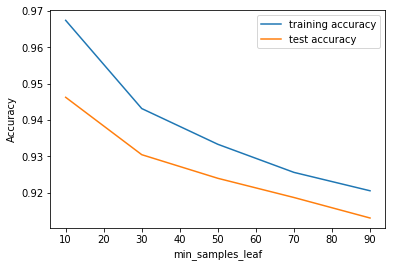

In [137]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

min_samples_leaf =10

In [141]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(10, 100, 20)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': range(10, 100, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [142]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.278782,0.063054,0.019766,0.003692,10,{'min_samples_split': 10},0.927259,0.966598,0.967374,0.968022,...,0.959453,0.016108,1,0.994498,0.992071,0.992038,0.991974,0.990744,0.992265,0.001223
1,2.262466,0.131586,0.018210,0.002258,30,{'min_samples_split': 30},0.918845,0.955852,0.959089,0.959606,...,0.950469,0.015869,2,0.984140,0.974497,0.976600,0.976471,0.975435,0.977429,0.003441
2,2.191540,0.039731,0.015113,0.000515,50,{'min_samples_split': 50},0.914445,0.955463,0.956629,0.955334,...,0.947103,0.016359,3,0.975013,0.966665,0.969092,0.968865,0.966470,0.969221,0.003092
3,2.119887,0.043969,0.015243,0.000605,70,{'min_samples_split': 70},0.907326,0.951191,0.949249,0.946919,...,0.940785,0.016786,4,0.966792,0.961227,0.961421,0.962004,0.960451,0.962379,0.002262
4,2.124318,0.051031,0.015446,0.000612,90,{'min_samples_split': 90},0.909267,0.947825,0.942905,0.943294,...,0.937782,0.014368,5,0.963134,0.954884,0.954204,0.955337,0.954075,0.956327,0.003435


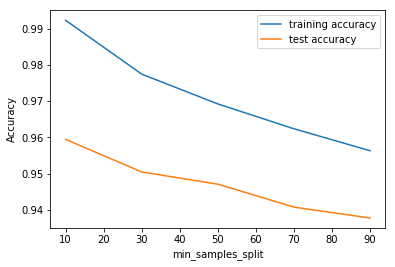

In [143]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

min_samples_split=10

## Model hyperparameters Tuning Using Grid Search

In [145]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [16, 20, 24],
    'min_samples_leaf': [10, 50],
    'min_samples_split': [10, 50],
    'n_estimators': [500, 600], 
    'max_features': [5, 7, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [146]:
grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 55.3min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 66.7min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [16, 20, 24], 'min_samples_leaf': [10, 50], 'min_samples_split': [10, 50], 'n_estimators': [500, 600], 'max_features': [5, 7, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [147]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9032157837501942 using {'max_depth': 24, 'max_features': 7, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 600}


In [154]:
# model with the best hyperparameters
#from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=24,
                             min_samples_leaf=10, 
                             min_samples_split=10,
                             max_features=7,
                             n_estimators=600)

In [155]:
# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=24, max_features=7, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=10,
            min_weight_fraction_leaf=0.0, n_estimators=600, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [156]:
# predict
predictions = rfc.predict(df_test_pca)

In [157]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93      8247
           1       0.39      0.67      0.49       753

   micro avg       0.88      0.88      0.88      9000
   macro avg       0.68      0.79      0.71      9000
weighted avg       0.92      0.88      0.90      9000



In [158]:
print(confusion_matrix(y_test,predictions))

[[7447  800]
 [ 249  504]]


In [ ]:
print(accuracy_score(y_test,predictions))

## Different Model evaluation, based on key performance metrics.

### 1. Applied SMOTE to take care of imabalanced data
Before smote we had only 8% positive value in the churn feature
After smote we had  50% positive value in the churn feature

### 2.  PCA for Dimensionality 
Next we applied PCA reduce dimensionality from 164 columns to 23 columns. 
Then we considered only columns with 90% variance, which recuded the number of features to 14.


### 3. Logistic Regression
We built a logistic regression model after applying PCA with 23 columns. In this case the accuracy was 86%. After this we built a logistic regression model after applying PCA with 14 columns. n this case the accuracy was 85%

### 4. Decision Tree
Next we built a decision tree model on the data with 14 features, with default parameter values. The accuracy in this case was 79%. 

Next tried to tune the hyperparameters individually and then finally we did a grid search for hyperparameter tuning. The following are the values of the hyperparameters: 

max_depth=14, min_samples_leaf=5, min_samples_split=10

After slecting the optimal hyperparamters, a final decision tree model was built and it had an accuracy of 82%




### 5. Random Forest

Next we built a decision tree model on the data with 14 features, with default parameter values. The accuracy in this case was 90%. 

Next tried to tune the hyperparameters individually and then finally we did a grid search for hyperparameter tuning. The following are the values of the hyperparameters: 

'max_depth': 24, 'max_features': 7, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 600


After slecting the optimal hyperparamters, a final decision tree model was built and it had an accuracy of 88%

The Random Forest algorithm provided the best accuracy

# Identifying important churn indicators and business recommendation 

From EDA and PCA we can infer that the following features are important churn indicators: 

'total_og_mou_6'
'total_og_mou_7'
'total_og_mou_8'
'std_og_mou_6'
'std_og_mou_7'
'std_og_mou_8'
'offnet_mou_6'
'offnet_mou_7'
'offnet_mou_8'
'onnet_mou_6'
'onnet_mou_7'
'onnet_mou_8'
'std_og_t2t_mou_6'
'std_og_t2t_mou_7'
'std_og_t2t_mou_8'

From EDA it is clear that the usage is decreasing from month June to July and furthermore decreasing from month July to August for churn customers. 

Therefore the business recommendation is to observe the decrease in usage from one month to next month and provide lucrative offers to retain the customer.